In [1]:
import torch
from torch import nn
from d2l import torch as d2l
from matplotlib import pyplot as plt

In [2]:
n_train = 50  # 训练样本数
x_train, _ = torch.sort(torch.rand(n_train) * 5)   # 排序后的训练样本

def f(x):
    return 2 * torch.sin(x) + x**0.8

y_train = f(x_train) + torch.normal(0.0, 0.5, (n_train,))  # 训练样本的输出
x_test = torch.arange(0, 5, 0.05)  # 测试样本
y_truth = f(x_test)  # 测试样本的真实输出
n_test = len(x_test)  # 测试样本数
n_test

100

In [3]:
def plot_kernel_reg(y_hat):
    d2l.plot(x_test, [y_truth, y_hat], 'x', 'y', legend=['Truth', 'Pred'],
             xlim=[0, 5], ylim=[-1, 5])
    d2l.plt.plot(x_train, y_train, 'o', alpha=0.5);

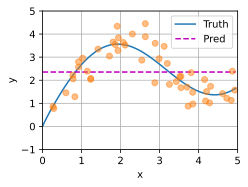

In [4]:
y_hat = torch.repeat_interleave(y_train.mean(), n_test)
plot_kernel_reg(y_hat)

In [5]:
# X_repeat is key, x_train is querry
X_repeat = x_test.repeat_interleave(n_train).reshape((-1, n_train))
# attention_weights is the attention weights for each key
attention_weights = nn.functional.softmax(-(X_repeat - x_train)**2 / 2, dim=1)
X_repeat - x_train,attention_weights, attention_weights.sum(dim=1), attention_weights.shape

(tensor([[-0.2671, -0.2873, -0.5986,  ..., -4.8364, -4.8656, -4.9266],
         [-0.2171, -0.2373, -0.5486,  ..., -4.7864, -4.8156, -4.8766],
         [-0.1671, -0.1873, -0.4986,  ..., -4.7364, -4.7656, -4.8266],
         ...,
         [ 4.5829,  4.5627,  4.2514,  ...,  0.0136, -0.0156, -0.0766],
         [ 4.6329,  4.6127,  4.3014,  ...,  0.0636,  0.0344, -0.0266],
         [ 4.6829,  4.6627,  4.3514,  ...,  0.1136,  0.0844,  0.0234]]),
 tensor([[9.4600e-02, 9.4073e-02, 8.1956e-02,  ..., 8.1672e-07, 7.0895e-07,
          5.2584e-07],
         [9.1273e-02, 9.0857e-02, 8.0396e-02,  ..., 9.9026e-07, 8.6085e-07,
          6.4045e-07],
         [8.7994e-02, 8.7681e-02, 7.8803e-02,  ..., 1.1997e-06, 1.0445e-06,
          7.7943e-07],
         ...,
         [1.8122e-06, 1.9870e-06, 7.8350e-06,  ..., 6.5891e-02, 6.5889e-02,
          6.5704e-02],
         [1.4945e-06, 1.6403e-06, 6.5693e-06,  ..., 6.8286e-02, 6.8384e-02,
          6.8400e-02],
         [1.2313e-06, 1.3528e-06, 5.5029e-06,  ..

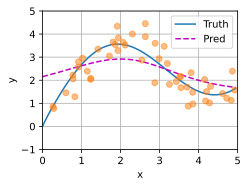

In [6]:
y_hat=attention_weights@y_train
plot_kernel_reg(y_hat)

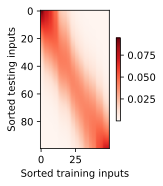

In [7]:
d2l.show_heatmaps(attention_weights.unsqueeze(0).unsqueeze(0),
                  xlabel='Sorted training inputs',
                  ylabel='Sorted testing inputs')

In [8]:
X = torch.ones((2, 1, 4))
Y = torch.ones((2, 4, 6))
torch.bmm(X, Y).shape

torch.Size([2, 1, 6])

In [9]:
weights = torch.ones((2, 10)) * 0.1
values = torch.arange(20.0).reshape((2, 10))
t=torch.bmm(weights.unsqueeze(1), values.unsqueeze(-1))
t.shape, t

(torch.Size([2, 1, 1]),
 tensor([[[ 4.5000]],
 
         [[14.5000]]]))

In [10]:
class MyNWKernelRegression(nn.Module):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.w=nn.Parameter(torch.rand(1,), requires_grad=True)
    
    def forward(self, queries, keys, values):
        # queries.shape: (queries_size)
        # keys.size: (keys_size)
        key_len = len(keys)
        queries=queries.repeat_interleave(key_len).reshape((-1, key_len))
        #print("queries: ", queries)
        distance=queries-keys
        #print("distance: ", distance)
        attention_weight=nn.functional.softmax(-0.5*((distance*self.w)**2), dim=1)
        #print("attention_weight: ", attention_weight)
        y=attention_weight@values
        return y

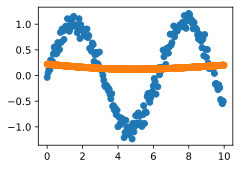

In [11]:
q=torch.arange(0, 10, 0.01)
k=torch.arange(0, 10, 0.05)
v=torch.sin(k)+torch.normal(0,0.1,(k.shape))
net=MyNWKernelRegression()
y_hat=net(q, k, v)
#print(q.shape)
#print(y_hat.shape)
#print(k.shape)
plt.scatter(k.detach(), v.detach())
plt.scatter(q.detach(), y_hat.detach())

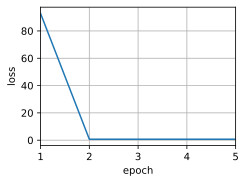

In [12]:
loss = nn.MSELoss(reduction='none')
trainer = torch.optim.SGD(net.parameters(), lr=0.5)
animator = d2l.Animator(xlabel='epoch', ylabel='loss', xlim=[1, 5])
for epoch in range(5):
    trainer.zero_grad()
    l=loss(net(k, k, v), v)
    l.sum().backward()
    trainer.step()
    print(f'epoch {epoch + 1}, loss {float(l.sum()):.6f}')
    animator.add(epoch + 1, float(l.sum()))

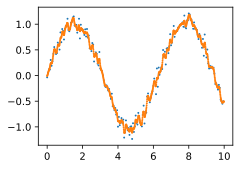

In [13]:
y_hat=net(q, k, v)
plt.scatter(k.detach(), v.detach(),s=1)
plt.scatter(q.detach(), y_hat.detach(),s=1)

In [14]:
class NWKernelRegression(nn.Module):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.w = nn.Parameter(torch.rand((1,), requires_grad=True))

    def forward(self, queries, keys, values):
        # queries和attention_weights的形状为(查询个数，“键－值”对个数)
        #print("values.shape: ", values.shape)
        queries = queries.repeat_interleave(keys.shape[1]).reshape((-1, keys.shape[1]))
        print("queries.shape: ", queries.shape)
        print("keys.shape: ", keys.shape)
        self.attention_weights = nn.functional.softmax(
            -((queries - keys) * self.w)**2 / 2, dim=1)
        # values的形状为(查询个数，“键－值”对个数)
        return torch.bmm(self.attention_weights.unsqueeze(1),
                         values.unsqueeze(-1)).reshape(-1)

In [15]:
# X_tile的形状:(n_train，n_train)，每一行都包含着相同的训练输入
X_tile = x_train.repeat((n_train, 1))
# Y_tile的形状:(n_train，n_train)，每一行都包含着相同的训练输出
Y_tile = y_train.repeat((n_train, 1))
# keys的形状:('n_train'，'n_train'-1)
# which means we remove one key, and utilize the left keys
# as key to train the model
keys = X_tile[(1 - torch.eye(n_train)).type(torch.bool)].reshape((n_train, -1))
values = Y_tile[(1 - torch.eye(n_train)).type(torch.bool)].reshape((n_train, -1))

queries.shape:  torch.Size([50, 49])
keys.shape:  torch.Size([50, 49])
epoch 1, loss 34.392170
queries.shape:  torch.Size([50, 49])
keys.shape:  torch.Size([50, 49])
epoch 2, loss 21.872482
queries.shape:  torch.Size([50, 49])
keys.shape:  torch.Size([50, 49])
epoch 3, loss 21.825781
queries.shape:  torch.Size([50, 49])
keys.shape:  torch.Size([50, 49])
epoch 4, loss 21.778891
queries.shape:  torch.Size([50, 49])
keys.shape:  torch.Size([50, 49])
epoch 5, loss 21.731857


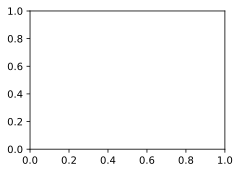

In [16]:
net = NWKernelRegression()
loss = nn.MSELoss(reduction='none')
trainer = torch.optim.SGD(net.parameters(), lr=0.5)
animator = d2l.Animator(xlabel='epoch', ylabel='loss', xlim=[1, 5])

for epoch in range(5):
    trainer.zero_grad()
    l = loss(net(x_train, keys, values), y_train)
    l.sum().backward()
    trainer.step()
    print(f'epoch {epoch + 1}, loss {float(l.sum()):.6f}')
    #animator.add(epoch + 1, float(l.sum()))

queries.shape:  torch.Size([100, 50])
keys.shape:  torch.Size([100, 50])


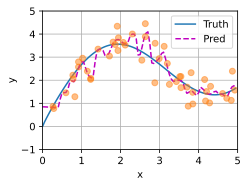

In [17]:
# keys的形状:(n_test，n_train)，每一行包含着相同的训练输入（例如，相同的键）
keys = x_train.repeat((n_test, 1))
# value的形状:(n_test，n_train)
values = y_train.repeat((n_test, 1))
y_hat = net(x_test, keys, values).unsqueeze(1).detach()
plot_kernel_reg(y_hat)

In [18]:
k=torch.arange(0, 10, 0.05)
v=torch.sin(k)+torch.normal(0,0.1,(k.shape))
k_train=k.repeat(len(k)).reshape(-1, len(k))
v_train=v.repeat(len(v)).reshape(-1, len(v))
k_train=k_train[(1-torch.eye(len(k))).type(torch.bool)].reshape((len(k), -1))
v_train=v_train[(1-torch.eye(len(v))).type(torch.bool)].reshape((len(v), -1))

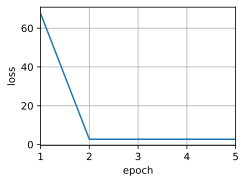

In [19]:
net = NWKernelRegression()
loss = nn.MSELoss(reduction='none')
trainer = torch.optim.SGD(net.parameters(), lr=0.5)
animator = d2l.Animator(xlabel='epoch', ylabel='loss', xlim=[1, 5])

for epoch in range(5):
    trainer.zero_grad()
    #print("k.shape: ", k.shape)
    #print("k_train.shape: ", k_train.shape)
    #print("v_train.shape: ", v_train.shape)
    l = loss(net(k, k_train, v_train), v)
    l.sum().backward()
    trainer.step()
    print(f'epoch {epoch + 1}, loss {float(l.sum()):.6f}')
    animator.add(epoch + 1, float(l.sum()))

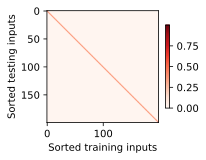

In [20]:
d2l.show_heatmaps(net.attention_weights.unsqueeze(0).unsqueeze(0),
                  xlabel='Sorted training inputs',
                  ylabel='Sorted testing inputs')

In [21]:
q=torch.arange(0, 5, 0.025)
v_train2=torch.cos(k_train)
y_hat=net(q, k_train, v_train2)
plt.scatter(k_train.detach(), v_train2.detach(),s=1)
plt.scatter(q.detach(), y_hat.detach(),s=1)
net.w

queries.shape:  torch.Size([200, 199])
keys.shape:  torch.Size([200, 199])


Parameter containing:
tensor([64.4954], requires_grad=True)

In [22]:
q=torch.arange(0, 5, 0.025)
v_train2=torch.cos(k_train)
net.w.data=torch.tensor([1.])
y_hat=net(q, k_train, v_train2)
plt.scatter(k_train.detach(), v_train2.detach(),s=1)
plt.scatter(q.detach(), y_hat.detach(),s=1)
net.w

queries.shape:  torch.Size([200, 199])
keys.shape:  torch.Size([200, 199])


Parameter containing:
tensor([1.], requires_grad=True)